# Data Preparation

In [4]:
!pip install fiftyone
#!pip install fiftyone-db-ubuntu2204

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 122.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 169.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 943.0/943.0 kB 623.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.0/54.0 MB 205.3 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 796.9/796.9 kB 740.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 541.1/541.1 kB 657.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 221.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 678.5 MB/s eta 0:00:00
  Created wheel for fiftyone-db: filename=fiftyone_db-1.3.0-py3-none-manylinux1_x86_64.whl size=571116

In [5]:
import fiftyone as fo
import fiftyone.zoo as foz

In [3]:
ds_train = foz.load_zoo_dataset(
    "coco-2017",
    split="train",
    dataset_name="COCO-2017-train",
    label_types=["detections"],
    classes=["person"],
    shuffle=True,
    max_samples=4000,
    seed=43
)

ds_val = foz.load_zoo_dataset(
    "coco-2017",
    split="validation",
    dataset_name="COCO-2017-validation",
    label_types=["detections"],
    classes=["person"],
    shuffle=True,
    max_samples=500,
    seed=43
)

ds_test = foz.load_zoo_dataset(
    "coco-2017",
    split="test",
    dataset_name="COCO-2017-test",
    label_types=["detections"],
    classes=["person"],
    shuffle=True,
    max_samples=500,
    seed=43
)

 100% |██████|    1.9Gb/1.9Gb [1.6m elapsed, 0s remaining, 10.4Mb/s]        
Extracting annotations to '/home/jovyan/fiftyone/coco-2017/raw/instances_train2017.json'
 100% |████████████████| 4000/4000 [12.1m elapsed, 0s remaining, 5.7 images/s]      
Writing annotations for 4000 downloaded samples to '/home/jovyan/fiftyone/coco-2017/train/labels.json'
Dataset info written to '/home/jovyan/fiftyone/coco-2017/info.json'
Loading 'coco-2017' split 'train'
 100% |███████████████| 4000/4000 [22.8s elapsed, 0s remaining, 184.7 samples/s]      
Dataset 'COCO-2017-train' created
Found annotations at '/home/jovyan/fiftyone/coco-2017/raw/instances_val2017.json'
 100% |██████████████████| 500/500 [1.5m elapsed, 0s remaining, 4.3 images/s]      
Writing annotations for 500 downloaded samples to '/home/jovyan/fiftyone/coco-2017/validation/labels.json'
Dataset info written to '/home/jovyan/fiftyone/coco-2017/info.json'
Loading 'coco-2017' split 'validation'
 100% |█████████████████| 500/500 [2.7s ela

In [5]:
def pickPersonLabel(dataset):
  # Iterate over the dataset
  for sample in dataset:
      # Get the detections
      detections = sample.ground_truth.detections
      # Filter out non-person detections
      detections = [d for d in detections if d.label == "person"]
      # Update the detections
      sample.ground_truth.detections = detections
      # Save the sample
      sample.save()

In [7]:
pickPersonLabel(ds_train)
pickPersonLabel(ds_val)
#pickPersonLabel(ds_test)

In [8]:
train_classes = ds_train.distinct("ground_truth.detections.label")
val_classes = ds_val.distinct("ground_truth.detections.label")
test_classes = ds_test.distinct("ground_truth.detections.label")

In [10]:
print("train classes:", train_classes)
print("val classes:", val_classes)
#print("test classes:", test_classes)

train classes: ['person']
val classes: ['person']


In [6]:
import fiftyone as fo
import fiftyone.utils.ultralytics as fou
import fiftyone.zoo as foz

In [13]:
# The path to export the dataset
EXPORT_DIR = "/home/jovyan/work/Indoensia_AI/P2/oiv7-yolo"

# YOLO format requires a common classes list
classes = ds_train.distinct("ground_truth.detections.label")

ds_train.export(
    export_dir=EXPORT_DIR,
    dataset_type=fo.types.YOLOv5Dataset,
    label_field="ground_truth",
    split="train",
    classes=classes,
)

ds_val.export(
    export_dir=EXPORT_DIR,
    dataset_type=fo.types.YOLOv5Dataset,
    label_field="ground_truth",
    split="val",
    classes=classes,
)

ds_test.export(
    export_dir=EXPORT_DIR,
    dataset_type=fo.types.YOLOv5Dataset,
    label_field="ground_truth",
    split="test",
    classes=classes,
)

 100% |███████████████| 4000/4000 [3.2m elapsed, 0s remaining, 20.2 samples/s]      
Directory '/home/jovyan/work/Indoensia_AI/P2/oiv7-yolo' already exists; export will be merged with existing files
 100% |█████████████████| 500/500 [24.1s elapsed, 0s remaining, 21.5 samples/s]      
Directory '/home/jovyan/work/Indoensia_AI/P2/oiv7-yolo' already exists; export will be merged with existing files
 100% |█████████████████| 500/500 [14.5s elapsed, 0s remaining, 34.9 samples/s]      


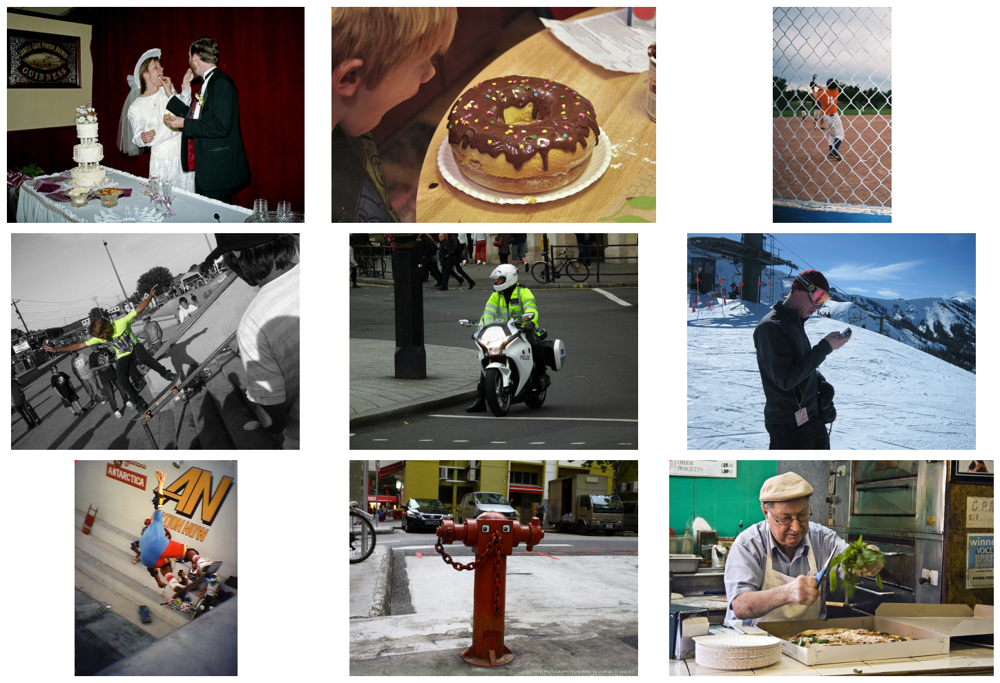

In [1]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import json
import os
import random

# Path ke direktori gambar dan label
images_dir = "/home/jovyan/work/Indoensia_AI/P2/oiv7-yolo/images/train"
labels_dir = "/home/jovyan/work/Indoensia_AI/P2/oiv7-yolo/labels/train"

# Mengambil daftar file gambar
image_files = os.listdir(images_dir)

# Mengambil 9 gambar secara acak
random_images = random.sample(image_files, 9)

# Membuat subplots
fig, axs = plt.subplots(3, 3, figsize=(15, 10))

# Iterasi melalui gambar yang dipilih secara acak
for i, image_file in enumerate(random_images):
    # Load gambar
    image_path = os.path.join(images_dir, image_file)
    image = plt.imread(image_path)

    # Load label
    label_path = os.path.join(labels_dir, os.path.splitext(image_file)[0] + ".txt")
    with open(label_path, "r") as f:
        lines = f.readlines()

    # Parsing bounding box dari label
    annotations = [list(map(float, line.strip().split())) for line in lines]

    # Plot gambar
    axs[i // 3, i % 3].imshow(image)

    # Plot bounding box dan anotasi
    for annotation in annotations:
        x_center, y_center, width, height = annotation[1:]
        x, y, w, h = (
            x_center - width / 2,
            y_center - height / 2,
            width,
            height
        )

        # Plot bounding box
        rect = patches.Rectangle(
            (x, y),
            w,
            h,
            linewidth=2,
            edgecolor="red",
            facecolor="none",
        )
        axs[i // 3, i % 3].add_patch(rect)

    axs[i // 3, i % 3].axis("off")

plt.tight_layout()
plt.show()

In [8]:
%cd /home/jovyan/work/Indoensia_AI/P2/
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -qr requirements.txt

/home/jovyan/work/Indoensia_AI/P2
fatal: destination path 'yolov5' already exists and is not an empty directory.
/home/jovyan/work/Indoensia_AI/P2/yolov5


In [17]:
%%writefile yolo_data.yaml

path: /home/jovyan/work/Indoensia_AI/P2/oiv7-yolo  # dataset root dir
train: ./images/train/
val: ./images/val/
test: ./images/test/

# Classes
names:
  0: person


Writing yolo_data.yaml


#  YOLOv5s

In [ ]:
%cd /home/jovyan/work/Indoensia_AI/P2/yolov5

!python train.py --img 640 --batch 16 --epochs 100 --data /home/jovyan/work/Indoensia_AI/P2/yolov5/yolo_data.yaml --cfg /home/jovyan/work/Indoensia_AI/P2/yolov5/models/yolov5s.yaml --weights yolov5x.pt --name yolov5s_v5xpretrained_epoch100


/home/jovyan/work/Indoensia_AI/P2/yolov5
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/home/jovyan/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
2025-07-09 15:37:54.453653: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1752075474.471642    1862 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752075474.476921    1862 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5x.pt, cfg=/home/jovyan/work/Indoensia_AI/P2/yolov5/models

In [10]:
# membuat zipfile hasil training
import shutil

source_folder = '/home/jovyan/work/Indoensia_AI/P2/yolov5/runs/train/yolov5s_v5xpretrained_epoch100'
shutil.make_archive('/home/jovyan/work/Indoensia_AI/P2/yolov5/runs/train/yolov5s_v5xpretrained_epoch100', 'zip', source_folder)

'/home/jovyan/work/Indoensia_AI/P2/yolov5/runs/train/yolov5s_v5xpretrained_epoch100.zip'

## Validation

In [15]:
%cd /home/jovyan/work/Indoensia_AI/P2/yolov5

!python val.py \
  --weights runs/train/yolov5s_v5xpretrained_epoch100/weights/best.pt \
  --data /home/jovyan/work/Indoensia_AI/P2/yolov5/yolo_data.yaml \
  --img 640 \
  --task val \
  --name yolo5s

/home/jovyan/work/Indoensia_AI/P2/yolov5
val: data=/home/jovyan/work/Indoensia_AI/P2/yolov5/yolo_data.yaml, weights=['runs/train/yolov5s_v5xpretrained_epoch100/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=yolo5s, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-422-g2540fd4c Python-3.12.9 torch-2.6.0+cu126 CUDA:0 (NVIDIA L40S, 45468MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /home/jovyan/work/Indoensia_AI/P2/oiv7-yolo/labels/val.cache... 50
                 Class     Images  Instances          P          R      mAP50   
                   all        500       2157      0.725      0.541      0.624      0.343
Speed: 0.1ms pre-process, 1.3ms inference, 1.3ms NMS per image at shape (32, 3, 640, 640)
Results 

### Inference Image Testing 

In [16]:
%cd /home/jovyan/work/Indoensia_AI/P2/yolov5

!python detect.py \
  --weights runs/train/yolov5s_v5xpretrained_epoch100/weights/best.pt \
  --source /home/jovyan/work/Indoensia_AI/P2/oiv7-yolo/images/test \
  --img 640 \
  --conf 0.25 \
  --name inference_yolo5s

/home/jovyan/work/Indoensia_AI/P2/yolov5
detect: weights=['runs/train/yolov5s_v5xpretrained_epoch100/weights/best.pt'], source=/home/jovyan/work/Indoensia_AI/P2/oiv7-yolo/images/test, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_yolo5s, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-422-g2540fd4c Python-3.12.9 torch-2.6.0+cu126 CUDA:0 (NVIDIA L40S, 45468MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/500 /home/jovyan/work/Indoensia_AI/P2/oiv7-yolo/images/test/000000000276.jpg: 480x640 (no detections), 37.3ms
image 2/500 /home/jovyan/work/Indoensia_AI/P2/oiv7-yolo/images/test/0000000

### Preview Inference Image Test

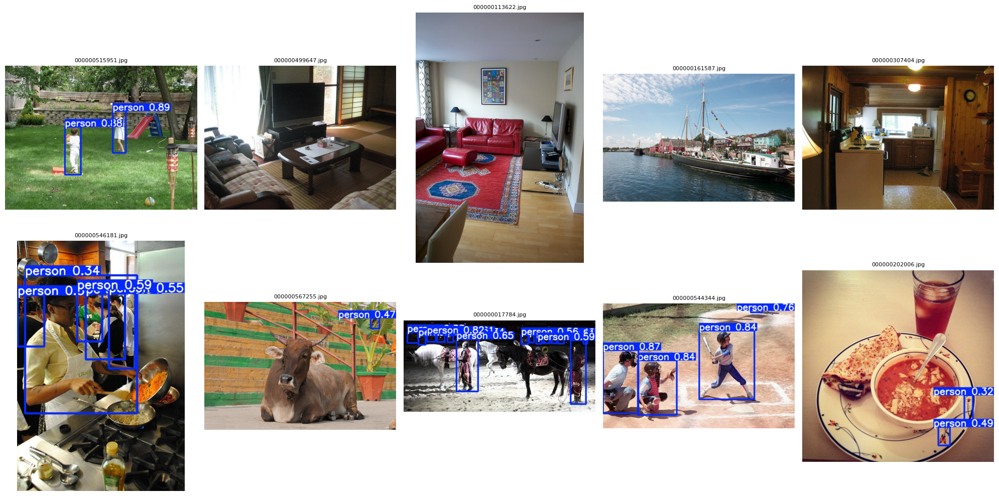

In [17]:
import os
import random
import matplotlib.pyplot as plt
import cv2

# Path folder hasil deteksi
result_dir = "/home/jovyan/work/Indoensia_AI/P2/yolov5/runs/detect/inference_yolo5s"

# Ambil semua nama file gambar di folder tersebut
all_images = [f for f in os.listdir(result_dir) if f.lower().endswith(('.jpg', '.png'))]

# Ambil 10 gambar secara acak
sample_images = random.sample(all_images, min(10, len(all_images)))

# Tampilkan 10 gambar
plt.figure(figsize=(20, 10))
for i, img_name in enumerate(sample_images):
    img_path = os.path.join(result_dir, img_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    plt.title(img_name, fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()


#  YOLOv5x

In [ ]:
%cd /home/jovyan/work/Indoensia_AI/P2/yolov5

!python train.py --img 640 --batch 8 --epochs 50 --data /home/jovyan/work/Indoensia_AI/P2/yolov5/yolo_data.yaml --cfg /home/jovyan/work/Indoensia_AI/P2/yolov5/models/yolov5x.yaml --weights yolov5x.pt --name yolov5x_v5xpretrained_epoch50


/home/jovyan/work/Indoensia_AI/P2/yolov5
2025-07-09 16:31:46.291087: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1752078706.308952   10664 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752078706.314237   10664 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5x.pt, cfg=/home/jovyan/work/Indoensia_AI/P2/yolov5/models/yolov5x.yaml, data=/home/jovyan/work/Indoensia_AI/P2/yolov5/yolo_data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=8, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None

In [19]:
# membuat zipfile hasil training
import shutil

source_folder = '/home/jovyan/work/Indoensia_AI/P2/yolov5/runs/train/yolov5x_v5xpretrained_epoch50'
shutil.make_archive('/home/jovyan/work/Indoensia_AI/P2/yolov5/runs/train/yolov5x_v5xpretrained_epoch50', 'zip', source_folder)

'/home/jovyan/work/Indoensia_AI/P2/yolov5/runs/train/yolov5x_v5xpretrained_epoch50.zip'

## Validation

In [1]:
%cd /home/jovyan/work/Indoensia_AI/P2/yolov5

!python val.py \
  --weights runs/train/yolov5x_v5xpretrained_epoch50/weights/best.pt \
  --data /home/jovyan/work/Indoensia_AI/P2/yolov5/yolo_data.yaml \
  --img 640 \
  --task val \
  --name yolo5x


/home/jovyan/work/Indoensia_AI/P2/yolov5
val: data=/home/jovyan/work/Indoensia_AI/P2/yolov5/yolo_data.yaml, weights=['runs/train/yolov5x_v5xpretrained_epoch50/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=yolo5x, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-422-g2540fd4c Python-3.12.9 torch-2.6.0+cu126 CUDA:0 (NVIDIA L40S, 45468MiB)

Fusing layers... 
YOLOv5x summary: 322 layers, 86173414 parameters, 0 gradients, 203.8 GFLOPs
val: Scanning /home/jovyan/work/Indoensia_AI/P2/oiv7-yolo/labels/val.cache... 50
                 Class     Images  Instances          P          R      mAP50   
                   all        500       2157      0.786      0.673      0.747      0.506
Speed: 0.1ms pre-process, 4.8ms inference, 1.3ms NMS per image at shape (32, 3, 640, 640)
Results

### Inference Image Testing 

In [24]:
%cd /home/jovyan/work/Indoensia_AI/P2/yolov5

!python detect.py \
  --weights runs/train/yolov5x_v5xpretrained_epoch50/weights/best.pt \
  --source /home/jovyan/work/Indoensia_AI/P2/oiv7-yolo/images/test \
  --img 640 \
  --conf 0.25 \
  --name inference_yolo5x

/home/jovyan/work/Indoensia_AI/P2/yolov5
detect: weights=['runs/train/yolov5x_v5xpretrained_epoch50/weights/best.pt'], source=/home/jovyan/work/Indoensia_AI/P2/oiv7-yolo/images/test, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_yolo5x, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-422-g2540fd4c Python-3.12.9 torch-2.6.0+cu126 CUDA:0 (NVIDIA L40S, 45468MiB)

Fusing layers... 
YOLOv5x summary: 322 layers, 86173414 parameters, 0 gradients, 203.8 GFLOPs
image 1/500 /home/jovyan/work/Indoensia_AI/P2/oiv7-yolo/images/test/000000000276.jpg: 480x640 (no detections), 39.8ms
image 2/500 /home/jovyan/work/Indoensia_AI/P2/oiv7-yolo/images/test/000000

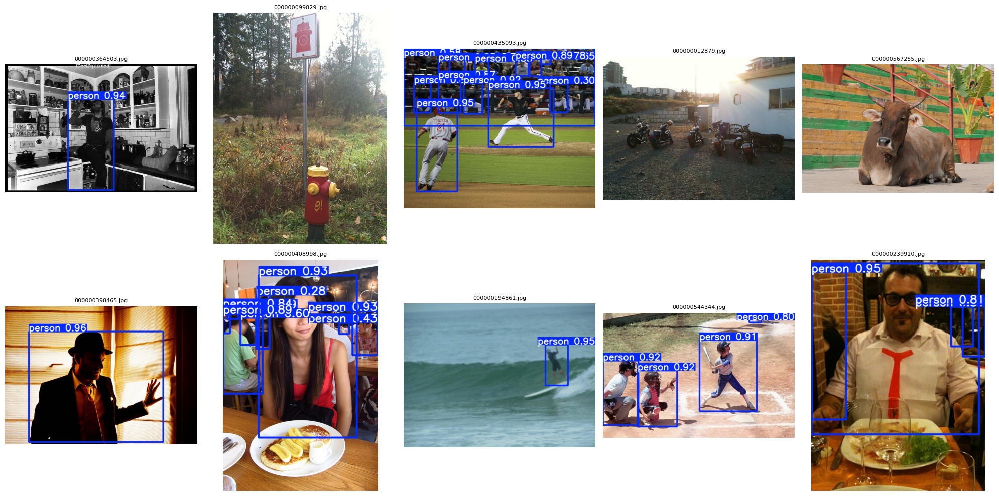

In [28]:
import os
import random
import matplotlib.pyplot as plt
import cv2

# Path folder hasil deteksi
result_dir = "/home/jovyan/work/Indoensia_AI/P2/yolov5/runs/detect/inference_yolo5x"

# Ambil semua nama file gambar di folder tersebut
all_images = [f for f in os.listdir(result_dir) if f.lower().endswith(('.jpg', '.png'))]

# Ambil 10 gambar secara acak
sample_images = random.sample(all_images, min(10, len(all_images)))

# Tampilkan 10 gambar
plt.figure(figsize=(20, 10))
for i, img_name in enumerate(sample_images):
    img_path = os.path.join(result_dir, img_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    plt.title(img_name, fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()


### Video Inference

#### Yolo5s

In [22]:
%cd /home/jovyan/work/Indoensia_AI/P2/yolov5

!python detect.py \
  --weights runs/train/yolov5s_v5xpretrained_epoch100/weights/best.pt \
  --source /home/jovyan/work/Indoensia_AI/P2/video1.mp4 \
  --conf 0.25 \
  --img 640 \
  --name inference_vidoe_yolo5s

/home/jovyan/work/Indoensia_AI/P2/yolov5
detect: weights=['runs/train/yolov5s_v5xpretrained_epoch100/weights/best.pt'], source=/home/jovyan/work/Indoensia_AI/P2/video1.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_vidoe_yolo5s, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-422-g2540fd4c Python-3.12.9 torch-2.6.0+cu126 CUDA:0 (NVIDIA L40S, 45468MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/573) /home/jovyan/work/Indoensia_AI/P2/video1.mp4: 384x640 10 persons, 38.6ms
video 1/1 (2/573) /home/jovyan/work/Indoensia_AI/P2/video1.mp4: 384x640 9 persons, 5.5ms
video 1/1 (3/573) 

#### Yolo5x

In [21]:
%cd /home/jovyan/work/Indoensia_AI/P2/yolov5

!python detect.py \
  --weights runs/train/yolov5x_v5xpretrained_epoch50/weights/best.pt \
  --source /home/jovyan/work/Indoensia_AI/P2/video1.mp4 \
  --conf 0.25 \
  --img 640 \
  --name inference_vidoe_yolo5x


/home/jovyan/work/Indoensia_AI/P2/yolov5
detect: weights=['runs/train/yolov5x_v5xpretrained_epoch50/weights/best.pt'], source=/home/jovyan/work/Indoensia_AI/P2/video1.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_vidoe_yolo5x, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-422-g2540fd4c Python-3.12.9 torch-2.6.0+cu126 CUDA:0 (NVIDIA L40S, 45468MiB)

Fusing layers... 
YOLOv5x summary: 322 layers, 86173414 parameters, 0 gradients, 203.8 GFLOPs
video 1/1 (1/573) /home/jovyan/work/Indoensia_AI/P2/video1.mp4: 384x640 12 persons, 40.3ms
video 1/1 (2/573) /home/jovyan/work/Indoensia_AI/P2/video1.mp4: 384x640 12 persons, 9.2ms
video 1/1 (3/573